In [1]:
import os
import sys
PATH = os.path.join(os.getcwd(), '..')
sys.path.append(PATH)

import time
import argparse
from functools import partial

from fastai import *
from fastai.vision import *
from torch.utils.data import DataLoader

import numpy as np
import matplotlib.pyplot as plt

from src.model.meta_model import MetaModel
from src.data.dataset import NeuralDataset
from src.data.tfms import get_transforms
from src.train.loss import PerceptualLoss
from src.train.callback import EssentialCallback, SaveCallback

%load_ext autoreload
%autoreload 2

In [2]:
img_size = 128
data_dir = '/userhome/34/h3509807/train2014'
bs = 16
chkpt_model_dir = '../chkpts/test'
style_img_path = '../style/cuson_arts.jpg'
content_img_path = '../test/hk_001.jfif'
plot_iter = 10
content_weight = 1e5
style_weight = 1e10

In [3]:
tfms = get_transforms(img_size)
ds = NeuralDataset(data_dir, transform = tfms)
train_dl = DataLoader(ds, batch_size = bs, shuffle = True, num_workers = 0)
# val_dl serves as dummy
val_dl = DataLoader(ds, batch_size = 1, shuffle = False, num_workers = 0)
data = DataBunch(train_dl, val_dl)

# setup model and callbacks
model = MetaModel(vgg_grad = False)
essential_cb = partial(
    EssentialCallback, 
    chkpt_dir = chkpt_model_dir,
    content_path = content_img_path,
    style_path = style_img_path,
    plot_iter = plot_iter
    )
save_cb = partial(
    SaveCallback, 
    chkpt_epoch = 1, 
    chkpt_model_dir = chkpt_model_dir
    )

# setup loss
perceptual_loss = partial(
    PerceptualLoss, 
    model = model, 
    content_weight = content_weight, 
    style_weight = style_weight
    )

# setup learner and start training
learn = Learner(
    data, model, # only optimize on transformer net 
    loss_func = perceptual_loss(), 
    opt_func = partial(optim.Adam, betas = (0.5, 0.99)),
    callback_fns = [essential_cb, save_cb],
    layer_groups = model.transformer
    )

2020-04-07 23:22:31,687 — root — INFO — train data transform is initialized
2020-04-07 23:22:31,805 — root — INFO — NeuralDataset built -- (82783)
2020-04-07 23:22:38,452 — root — INFO — meta model is set


2020-04-07 23:22:38,534 — root — INFO — hooks are initialized
2020-04-07 23:22:40,539 — root — INFO — read style img: ../style/cuson_arts.jpg
2020-04-07 23:22:41,069 — root — INFO — gram matrices for style image is precomputed


epoch,train_loss,valid_loss,time


2020-04-07 23:22:43,131 — root — INFO — test data transform is initialized


figure saved: ../chkpts/test/gram_matrix/relu1_2_iter0000000.png
figure saved: ../chkpts/test/gram_matrix/relu2_2_iter0000000.png
figure saved: ../chkpts/test/gram_matrix/relu3_3_iter0000000.png
figure saved: ../chkpts/test/gram_matrix/relu4_3_iter0000000.png
stylised image written: ../chkpts/test/test/stylised_iter0000000.png


2020-04-07 23:22:55,415 — root — INFO — test data transform is initialized


figure saved: ../chkpts/test/gram_matrix/relu1_2_iter0000010.png
figure saved: ../chkpts/test/gram_matrix/relu2_2_iter0000010.png
figure saved: ../chkpts/test/gram_matrix/relu3_3_iter0000010.png
figure saved: ../chkpts/test/gram_matrix/relu4_3_iter0000010.png
stylised image written: ../chkpts/test/test/stylised_iter0000010.png


2020-04-07 23:23:04,890 — root — INFO — test data transform is initialized


figure saved: ../chkpts/test/gram_matrix/relu1_2_iter0000020.png
figure saved: ../chkpts/test/gram_matrix/relu2_2_iter0000020.png
figure saved: ../chkpts/test/gram_matrix/relu3_3_iter0000020.png
figure saved: ../chkpts/test/gram_matrix/relu4_3_iter0000020.png
stylised image written: ../chkpts/test/test/stylised_iter0000020.png


2020-04-07 23:23:17,112 — root — INFO — test data transform is initialized


figure saved: ../chkpts/test/gram_matrix/relu1_2_iter0000030.png
figure saved: ../chkpts/test/gram_matrix/relu2_2_iter0000030.png
figure saved: ../chkpts/test/gram_matrix/relu3_3_iter0000030.png
figure saved: ../chkpts/test/gram_matrix/relu4_3_iter0000030.png
stylised image written: ../chkpts/test/test/stylised_iter0000030.png


2020-04-07 23:23:29,053 — root — INFO — test data transform is initialized
/userhome/34/h3509807/fastai/PerceptualLoss-FastAI/ipynb/../src/common/vis_utils.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize= (15, 8))


figure saved: ../chkpts/test/gram_matrix/relu1_2_iter0000040.png
figure saved: ../chkpts/test/gram_matrix/relu2_2_iter0000040.png
figure saved: ../chkpts/test/gram_matrix/relu3_3_iter0000040.png
figure saved: ../chkpts/test/gram_matrix/relu4_3_iter0000040.png


/userhome/34/h3509807/fastai/PerceptualLoss-FastAI/ipynb/../src/common/vis_utils.py:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize= (15, 8))


stylised image written: ../chkpts/test/test/stylised_iter0000040.png


2020-04-07 23:23:42,321 — root — INFO — test data transform is initialized


figure saved: ../chkpts/test/gram_matrix/relu1_2_iter0000050.png
figure saved: ../chkpts/test/gram_matrix/relu2_2_iter0000050.png
figure saved: ../chkpts/test/gram_matrix/relu3_3_iter0000050.png
figure saved: ../chkpts/test/gram_matrix/relu4_3_iter0000050.png
stylised image written: ../chkpts/test/test/stylised_iter0000050.png


2020-04-07 23:23:51,977 — root — INFO — test data transform is initialized


figure saved: ../chkpts/test/gram_matrix/relu1_2_iter0000060.png
figure saved: ../chkpts/test/gram_matrix/relu2_2_iter0000060.png
figure saved: ../chkpts/test/gram_matrix/relu3_3_iter0000060.png
figure saved: ../chkpts/test/gram_matrix/relu4_3_iter0000060.png
stylised image written: ../chkpts/test/test/stylised_iter0000060.png


2020-04-07 23:24:01,336 — root — INFO — test data transform is initialized


figure saved: ../chkpts/test/gram_matrix/relu1_2_iter0000070.png
figure saved: ../chkpts/test/gram_matrix/relu2_2_iter0000070.png
figure saved: ../chkpts/test/gram_matrix/relu3_3_iter0000070.png
figure saved: ../chkpts/test/gram_matrix/relu4_3_iter0000070.png
stylised image written: ../chkpts/test/test/stylised_iter0000070.png


2020-04-07 23:24:07,600 — root — INFO — [epoch: 0] model saved: ../chkpts/test/chkpt_epoch_000.pth
2020-04-07 23:24:07,925 — root — INFO — [train complete] model saved: ../chkpts/test/final_epoch_001.pth


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


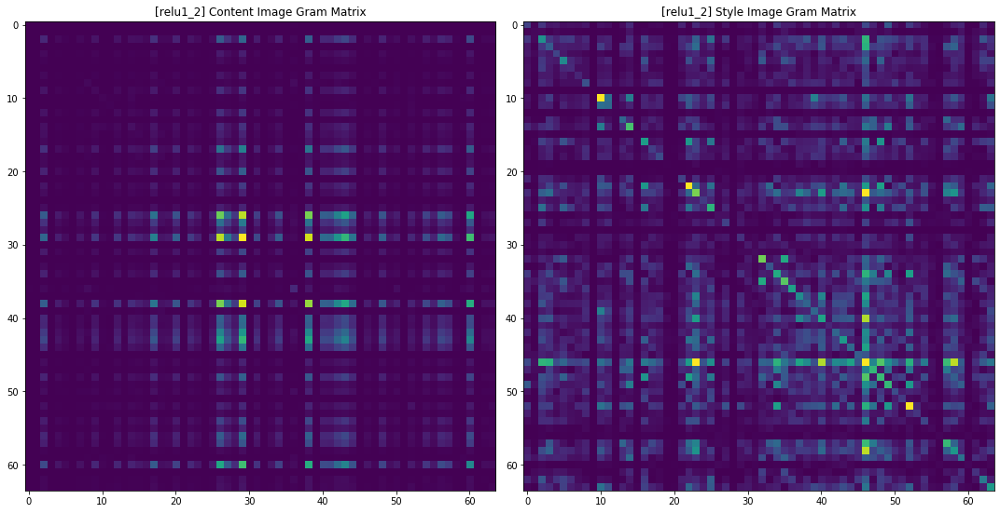

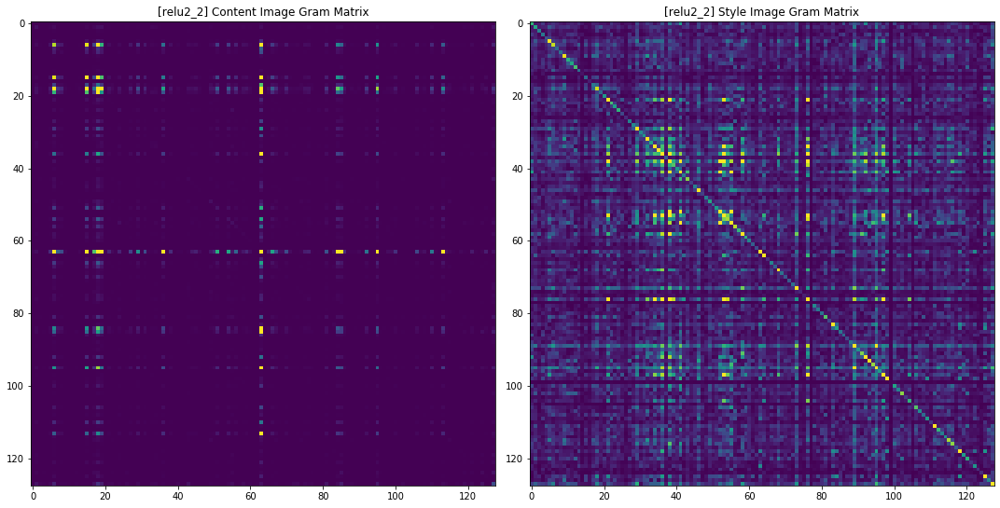

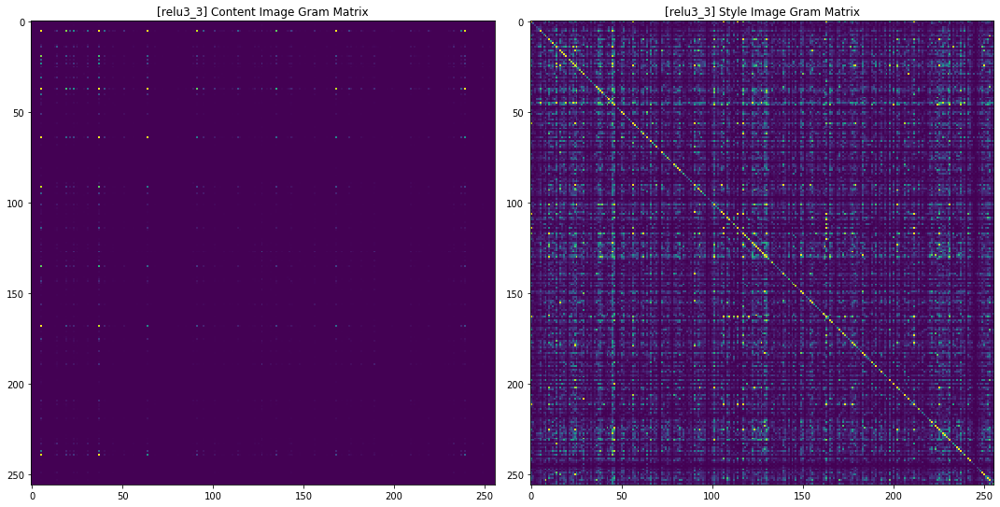

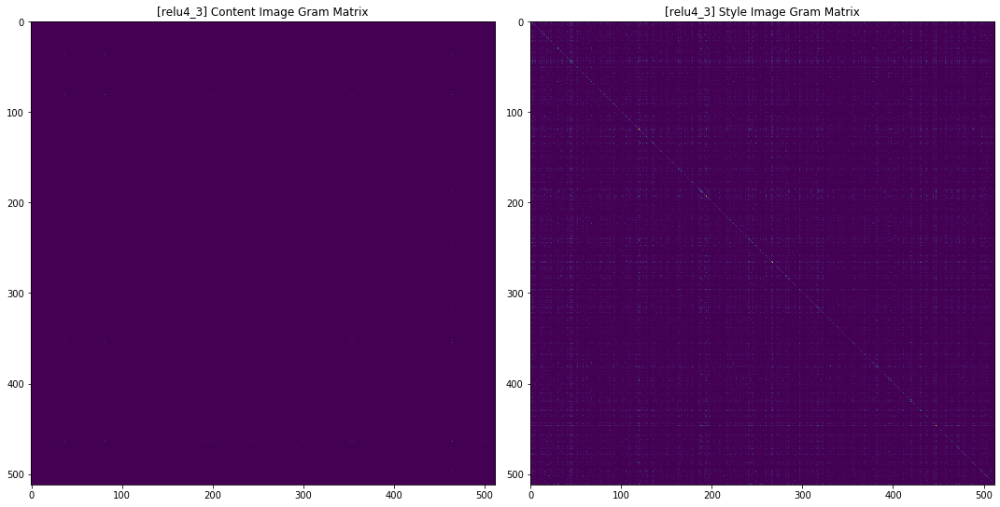

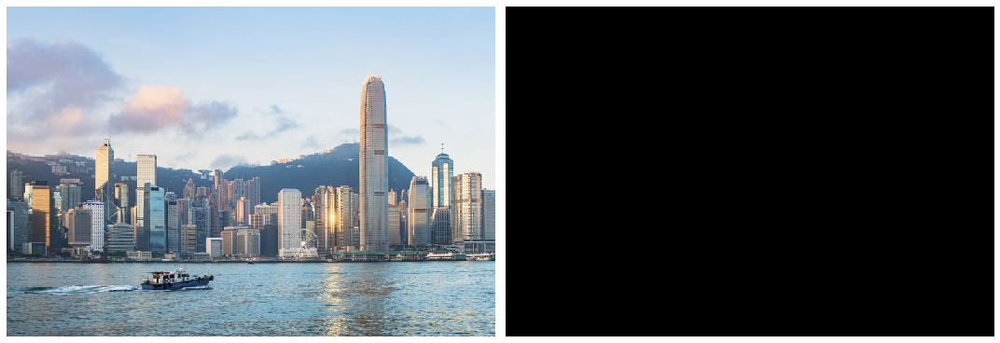

...

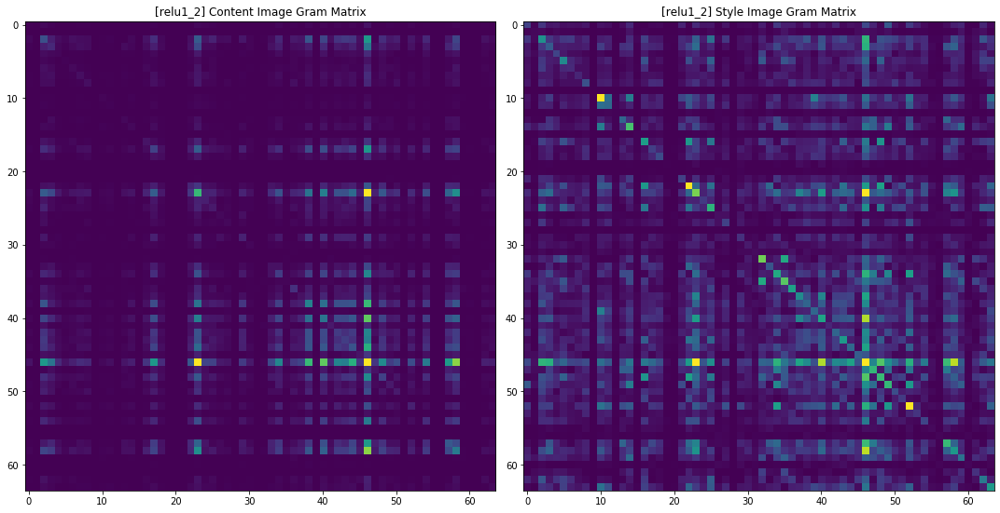

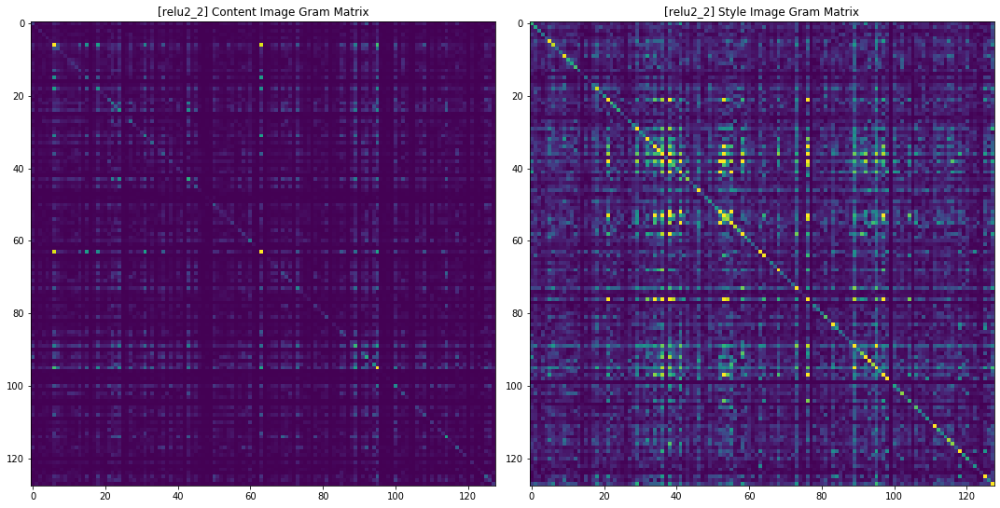

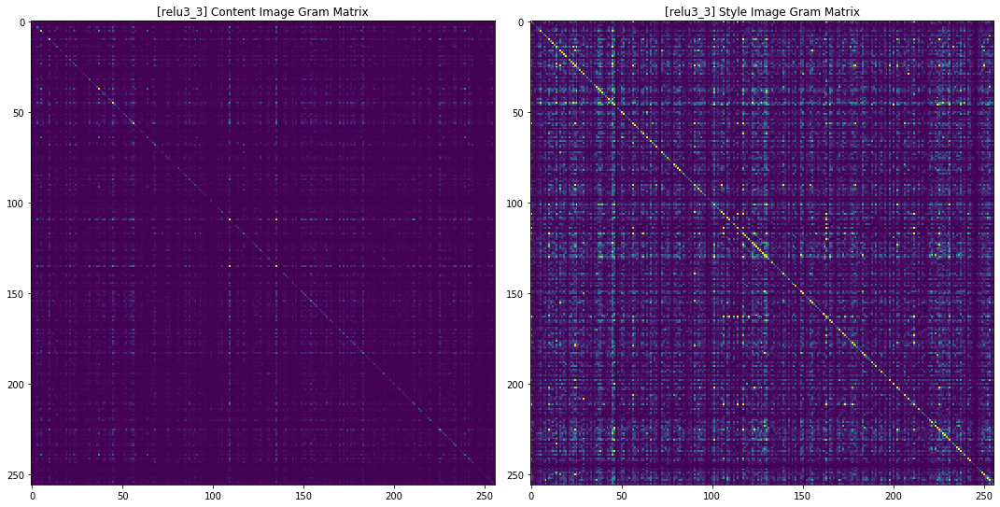

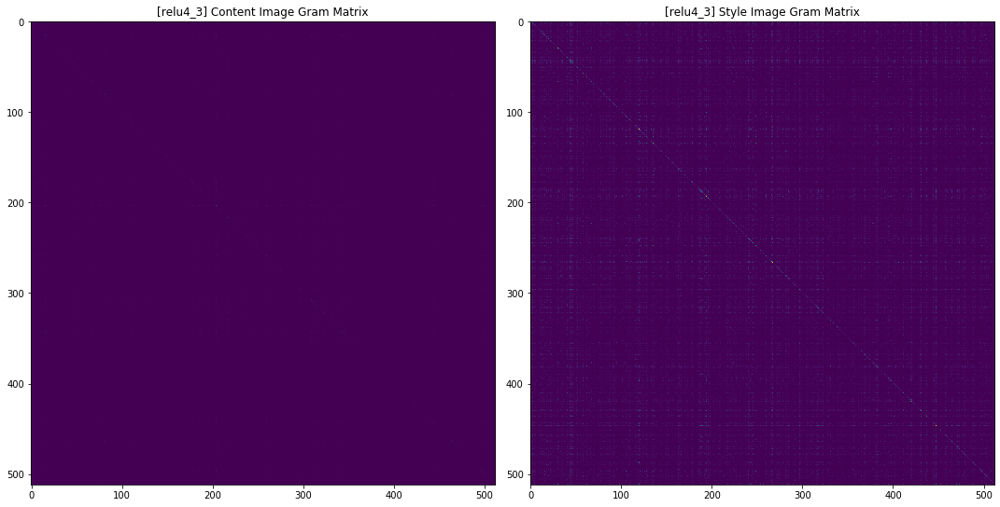

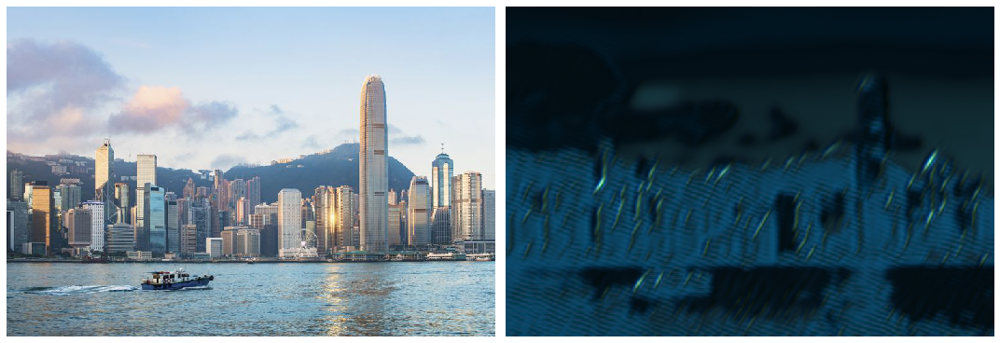

In [4]:
learn.lr_find()

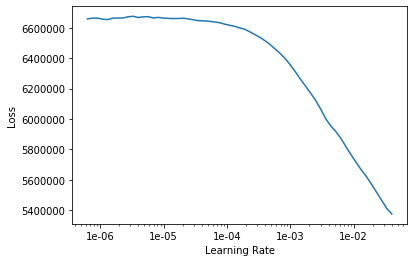

In [5]:
learn.recorder.plot()